### Import

Basic:

In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from PIL import Image
import os

Image processing:

In [2]:
import cv2
from scipy.ndimage import binary_fill_holes
from skimage import img_as_ubyte
from skimage.color import rgb2gray, rgb2hsv
from skimage.exposure import equalize_hist, histogram
from skimage.feature import canny
from skimage.filters import threshold_otsu, unsharp_mask, gaussian
from skimage.measure import find_contours, approximate_polygon
from skimage.morphology import (dilation, erosion, binary_closing, binary_opening,
                                remove_small_objects, thin, convex_hull_image, square, disk, diamond)
from skimage.util import invert

### Utils

In [3]:
def to_1ch(img, mode='gray'):
    transf_1ch = (
        {'r': lambda img: img[:, :, 0],
         'g': lambda img: img[:, :, 1],
         'b': lambda img: img[:, :, 2],
         'h': lambda img: img_as_ubyte(rgb2hsv(img)[:, :, 0]),
         's': lambda img: img_as_ubyte(rgb2hsv(img)[:, :, 1]),
         'v': lambda img: img_as_ubyte(rgb2hsv(img)[:, :, 2]),
         'gray': lambda img: img_as_ubyte(rgb2gray(img))}
    )
    return transf_1ch[mode](img)

In [4]:
def to_bin(img, thr='otsu'):
    if thr == 'otsu':
        return img > threshold_otsu(img)
    else:
        return img > 255 * thr

In [5]:
def to_bin_uint8(img):
    return img.astype(np.uint8) * 255

In [6]:
def list_get(list_, ind_, default_):
  try:
    return list_[ind_]
  except IndexError:
    return default_

In [7]:
def show_images(img_arr, name_arr=[], n_in_row=2, factor_r=6, factor_c=8, figsize=None,
         title=None, cmap_='Greys', label_fontsize=14, tick_fontsize=16, save_path=None):
    if type(img_arr) is np.ndarray:
        quant = img_arr.shape[0]
    elif type(img_arr) is list:
        quant = len(img_arr)
    cols = min(quant, n_in_row)
    rows = quant // n_in_row + (1 if quant % n_in_row else 0)
    if figsize is None:
        figsize = (int(factor_c * cols), int(factor_r * rows))
    fig = plt.figure(figsize=figsize)
    if title is not None:
        fig.suptitle(title, fontsize=14, y = 0.88)
    for i, img in enumerate(img_arr):
        ax = fig.add_subplot(rows, cols, i + 1)
        if type(img) is tuple:
            if len(img) == 1:
                img[0].show()
            else:
                x, y = img
                ax.plot(x, y)
                ax.set_xlabel(list_get(name_arr, i, ''), fontsize=label_fontsize)
        else:
            ax.imshow(img, cmap=cmap_)
            ax.xaxis.set_ticks_position('top')
            ax.tick_params(axis='both', labelsize=tick_fontsize)
    plt.tight_layout()
    if save_path is not None:
#         plt.savefig(f'{save_path}.jpg')
        plt.savefig(f'{save_path}.pdf')
    for i, img in enumerate(img_arr):  
        ax.set_xlabel(list_get(name_arr, i, ''), fontsize=label_fontsize, labelpad=10)
    plt.show()

In [8]:
def show_image_cv(img, name):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imshow(name, img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [9]:
def print_fig_info(figures):
    out = f'Figures quantity: {len(figures)}\n'
    for i, fig in enumerate(figures):
        out += f"{i+1}. {fig['type']}; center coords: ({fig['center'][0]}, {fig['center'][1]})\n"
    print(out)
    return out

### Solution

In [10]:
def bg_filter_1(img, chk_dump_vis=False):
    img = to_1ch(img, mode='s')
    img = canny(img, sigma=0.5)
    if chk_dump_vis:
        show_images([img], ['image (sat) edges by Canny operator'], save_path=f'{vis_folder}/sat_canny')
    img = binary_closing(img, disk(5))
    img = binary_fill_holes(img, disk(1))
    img = binary_opening(img, disk(15))
    img = erosion(img, disk(3))
    return img

def bg_filter_2(img, thr_a=0, thr_b=255, factor=0.4,
                chk_dump_vis=False, plot_name=None, label_fontsize=14,
                tick_fontsize=16, plot_savename=None):
    y, x = histogram(img)
    x, y = np.array(x), np.array(y)
    x, y = x[thr_a:thr_b+1], y[thr_a:thr_b+1]

    y_mean = np.mean(y)
    y_med = np.median(y)
    thr = y_med + np.abs(y_mean - y_med) * factor

    i0 = np.argmax(y)  
    i1, i2 = i0, i0
    i_min, i_max = 0, thr_b - thr_a

    for i in range(i0, i_min - 1, -1):
        if not (y[i] > thr):
            i1 = i
            break
        
    for i in range(i0, i_max + 1):
        if not (y[i] > thr):
            i2 = i
            break
            
    x1, x2 = x[i1], x[i2]
    img = (img >= x[i1]) & (img <= x[i2])
    img = binary_fill_holes(img, disk(1))

    if chk_dump_vis:
        y_mean_arr = np.full_like(y, y_mean)
        y_med_arr = np.full_like(y, y_med)
        thr_arr = np.full_like(y, thr)
        fig = plt.figure(figsize=(8, 8))
        plt.plot(x, y, label='y, histogram')
        plt.plot(x, y_mean_arr, label='y mean')
        plt.plot(x, y_med_arr, label='y median')
        plt.plot(x, thr_arr, label='threshold')
        plt.plot(x1, y[i1], 'bo', label='left bound')
        plt.plot(x2, y[i2], 'ro', label='right bound')
        plt.tick_params(axis='both', labelsize=tick_fontsize)
        plt.legend(fontsize=tick_fontsize)
        plt.tight_layout()
        if plot_name is not None:
            if plot_savename:
#                 plt.savefig(f'{plot_savename}.jpg')
                plt.savefig(f'{plot_savename}.pdf')
            plt.xlabel(plot_name, fontsize=label_fontsize, labelpad=10)
        plt.show();
    return img

def mask_cards(img, chk_dump_vis=False):
    # bg filter 1
    no_bg_1 = bg_filter_1(img, chk_dump_vis=chk_dump_vis)
    if chk_dump_vis:
        show_images([no_bg_1], ['bg filter 1 (edges)'], save_path=f'{vis_folder}/no_bg_1')
    # hue image
    hue = to_1ch(img, 'h')
    if chk_dump_vis:
        show_images([hue], ['image (hue)'], save_path=f'{vis_folder}/hue')
    # bg filter 2
    no_bg_2 = bg_filter_2(hue, chk_dump_vis=chk_dump_vis, plot_name='bg filter 2, hue histogram',
                          plot_savename=f'{vis_folder}/no_bg_2_hist')
    if chk_dump_vis:
        show_images([no_bg_2], ['bg filter 2 (colors)'], save_path=f'{vis_folder}/no_bg_2')
    # masked 1-channel (hue) image without bg
    no_bg_1_2 = no_bg_1 * no_bg_2
    if chk_dump_vis:
        show_images([no_bg_1_2], ['mask without bg'], save_path=f'{vis_folder}/no_bg_1_2')
    no_bg = hue * no_bg_1_2
    if chk_dump_vis:
        show_images([no_bg], ['image (hue) without bg'], save_path=f'{vis_folder}/no_bg_1_2_hue')
    # no image bg and no things on cards except the figures
    res = bg_filter_2(no_bg, thr_a = 15, factor=0.5, chk_dump_vis=chk_dump_vis,
                      plot_name='result, hue histogram', plot_savename=f'{vis_folder}/no_bg_1_2_hist') * to_bin(no_bg)
    if chk_dump_vis:
        show_images([res], ['no image bg and almost no things on cards except the figures'],
                    save_path=f'{vis_folder}/no_bg_res')
    return res

In [11]:
def mask_figures(img, mask, chk_dump_vis=False):
    # masked cards without background and drawings on them
    if chk_dump_vis:
        show_images([mask * to_1ch(img)], ['cleared cards and no bg on image (gray)'],
                    save_path=f'{vis_folder}/gray_no_bg')

    # light and sharpness initial correction
    img = to_1ch(img, mode='s')
    if chk_dump_vis:
        show_images([img], ['image (sat)'], save_path=f'{vis_folder}/sat')
    img = img / (gaussian(img, sigma=1.75) + 0.001)
    if chk_dump_vis:
        show_images([img], ['image (sat) without blackout or highlights'],
                    save_path=f'{vis_folder}/sat_light_1')
    img = equalize_hist(img)
    if chk_dump_vis:
        show_images([img], ['image (sat) light-corrected'], save_path=f'{vis_folder}/sat_light_2')
    img = gaussian(unsharp_mask(gaussian(img, sigma=1.0), radius=25, amount=3), sigma=1.0)
    if chk_dump_vis:
        show_images([img], ['image (sat) light-corrected with better borders sharpness, but with more noise'],
                    save_path=f'{vis_folder}/sat_sharp')
    img = invert(to_bin(img))
    if chk_dump_vis:
        show_images([img], ['binary full image with figures and cards'],
                    save_path=f'{vis_folder}/bin_sharp')
    
    # masking internal area of cards on light-corrected image
    img = img * erosion(binary_closing(mask, disk(1)), disk(4))
    if chk_dump_vis:
        show_images([img], ['binary image with only internal area of cards'],
                    save_path=f'{vis_folder}/bin_fig_0')

    # figure mask denoising 1
    img = binary_fill_holes(binary_closing(img, square(2)), disk(1))
    img = remove_small_objects(img, 1200, connectivity=2)
    if chk_dump_vis:
        show_images([img], ['binary denoising 1'], save_path=f'{vis_folder}/bin_fig_1')
    # figure mask denoising 2
    img = binary_fill_holes(binary_closing(img, square(3)), disk(1))
    img = binary_opening(img, disk(1))
    img = remove_small_objects(img, 1000, connectivity=2)
    if chk_dump_vis:
        show_images([img], ['binary denoising 2'], save_path=f'{vis_folder}/bin_fig_2')
    # figure mask denoising 3
    img = binary_fill_holes(binary_closing(img, square(5)), disk(1))
    if chk_dump_vis:
        show_images([img], ['binary denoising 3'], save_path=f'{vis_folder}/bin_fig_3')
    # figure mask denoising 4, masking denoised figures
    mask = binary_opening(img, disk(5))
    mask = remove_small_objects(mask, 500, connectivity=2)
    mask = dilation(mask, square(17))
    if chk_dump_vis:
        show_images([mask], ['denoising 4 mask'], save_path=f'{vis_folder}/bin_fig_4_mask')
    img = img * mask
                    
    # result
    if chk_dump_vis:
        show_images([img], ['final mask'], save_path=f'{vis_folder}/bin_fig_4')
    return img

In [12]:
def find_figures(img, mask, name='image',
                chk_fill=False, chk_border=True, chk_label=True):
    # reading image and mask
    main_img = img.copy()
    main_img = cv2.cvtColor(main_img, cv2.COLOR_RGB2BGR)
    main_mask = mask.copy()
    main_mask = to_bin_uint8(main_mask)

    # 4 groups of figures: 3 stages of polygons and 1 of not polygons
    border_arr = []
    quant = [0, 0, 0, 0]
    fill_colors = [(255, 0, 0),
                   (0, 255, 0),
                   (0, 255, 255),
                   (255, 255, 0)]
    border_color = [(0, 0, 255)] * 4

    # polygon approximation, 3 stages
    stage_tol = [0.017, 0.012, 0.02]
    stage_transf = ([
                    lambda img: (to_bin_uint8(unsharp_mask(thin(binary_closing(img, disk(2)), 2), radius=3, amount=4))),
                    lambda img: to_bin_uint8(thin(img, 2)),
                    lambda img: to_bin_uint8(unsharp_mask(img, radius=3, amount=4)),
                   ])
    stage_cond = ([
                  lambda l: l < 8,    # polygons with < 8 vertices
                  lambda l: l == 8,    # polygons with 8 vertices
                  lambda l: l > 8     # polygons with > 8 vertices
                 ])
    for i in range(3):
        stage_mask = stage_transf[i](main_mask)
        contours, _ = cv2.findContours(stage_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        for j, contour in enumerate(contours):
            epsilon= stage_tol[i] * cv2.arcLength(contour, True)
            borders = cv2.approxPolyDP(contour, epsilon, True)
            if stage_cond[i](len(borders)):
                # saving borders and unit of recognized figure
                border_arr.append(borders)
                quant[i] += 1
                # filling place of the recognized figure in the main_mask
                fig_mask = np.zeros_like(main_mask, np.uint8)
                cv2.drawContours(fig_mask, contours, j, color=255, thickness=cv2.FILLED)
                fig_mask = invert(cv2.dilate(fig_mask, disk(5)))
                main_mask = cv2.bitwise_and(main_mask, fig_mask)
                
    # not polygons
    contours, _ = cv2.findContours(main_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    border_arr += contours
    quant[3] = len(contours)
    
    # for info about figures
    figures = []
    
    # drawing borders an filling figures, labeling
    groups_ind = 0
    for i in range(4):
        for borders in border_arr[groups_ind:groups_ind+quant[i]]:
            center_coords = np.int32(borders.mean(axis=0)[0])
            fig_text = 'smooth'
            if chk_fill:
                cv2.drawContours(main_img, [borders], 0, fill_colors[i], cv2.FILLED)
            if chk_border:
                cv2.drawContours(main_img, [borders], 0, border_color[i], 2)
            if i < 3 and chk_label:
                # labels settings
                font_scale = 1
                font = cv2.FONT_HERSHEY_DUPLEX
                opacity_text_bg = 0.75
                # labels
                poly_text = 'P'
                conv_text = 'C' if cv2.isContourConvex(borders) else ''
                fig_text = f'{poly_text}{len(borders)}{conv_text}'
                (text_width, text_height) = cv2.getTextSize(fig_text, font, fontScale=font_scale, thickness=1)[0]
                text_offset_x, text_offset_y = (center_coords + borders[0][0]) // 2
                box_coords = ((text_offset_x + 2, text_offset_y + 2),
                              (text_offset_x + text_width + 2, text_offset_y - text_height - 2))
                overlay = main_img.copy()
                cv2.rectangle(overlay, box_coords[0], box_coords[1], (255, 255, 255), cv2.FILLED)
                cv2.addWeighted(overlay, opacity_text_bg, main_img, 1 - opacity_text_bg, 0, main_img)
                cv2.putText(main_img, fig_text, (text_offset_x, text_offset_y),
                            font, fontScale=font_scale, color=(0, 0, 0), thickness=1)
            figures.append({'center': center_coords, 'type': fig_text})
        groups_ind += quant[i]
    main_img = cv2.cvtColor(main_img, cv2.COLOR_BGR2RGB)
    return main_img, figures

### Example

In [13]:
input_folder = 'input'
vis_folder_ = 'vis'

# dump = show + save
chk_dump_vis = True

chk_fill = False
chk_border = True
chk_label = True

chk_save_res = True

In [14]:
src_images = []
src_names = []
for i in [1, 2, 4, 6, 7, 9, 10]:
    name = f'IMG_{i}.jpg'
    src_images.append(np.array(Image.open(f'{input_folder}/{name}')))
    src_names.append(name)

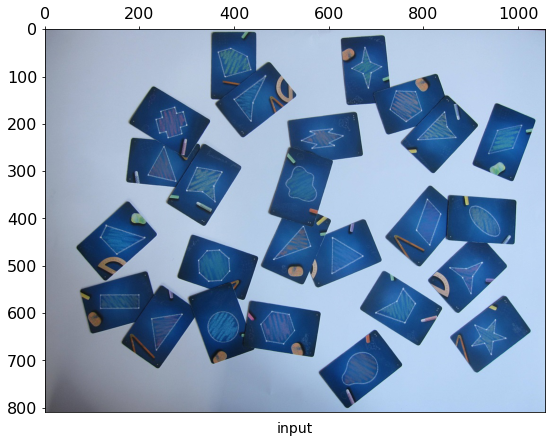

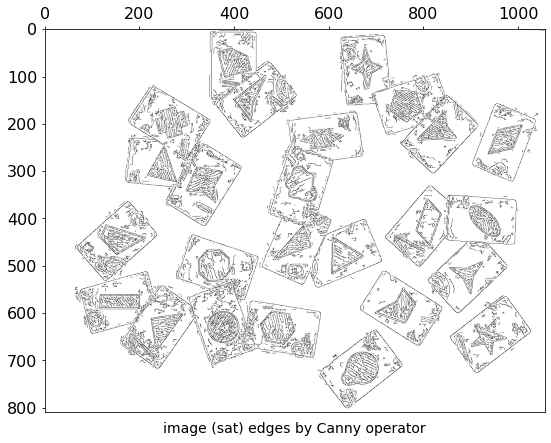

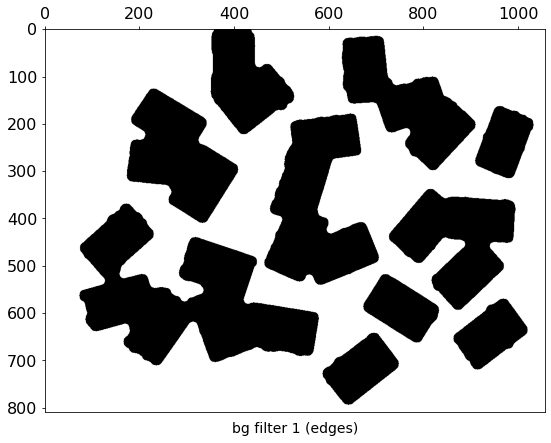

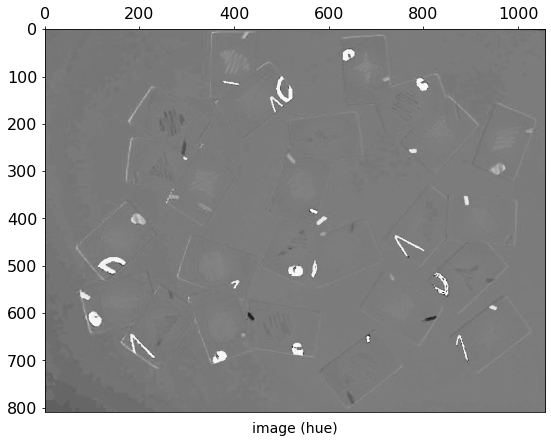

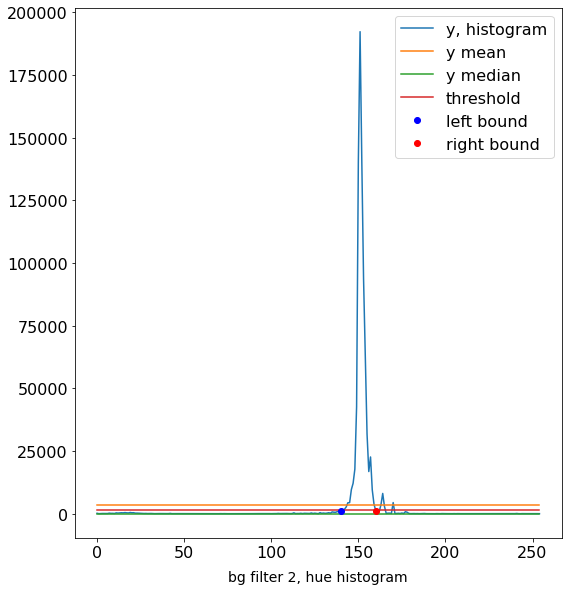

...

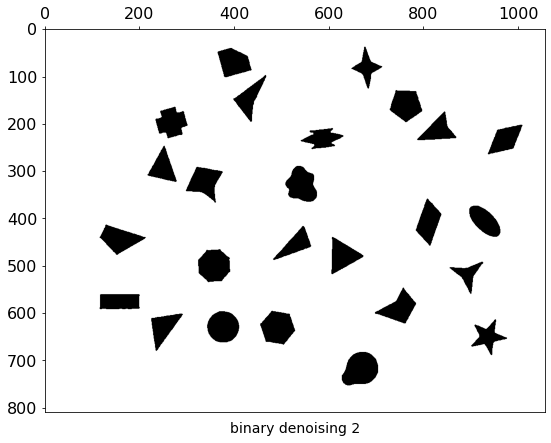

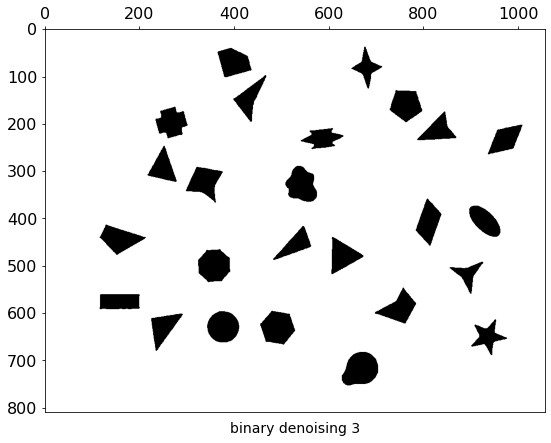

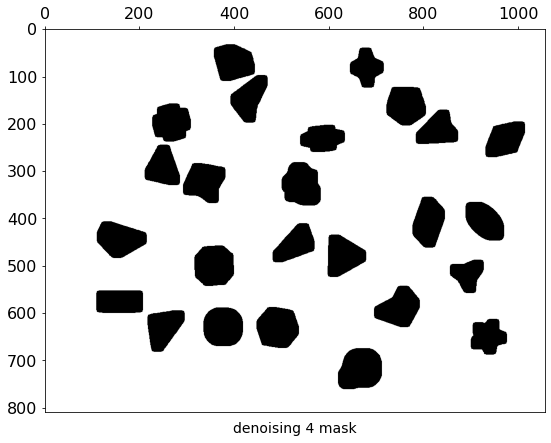

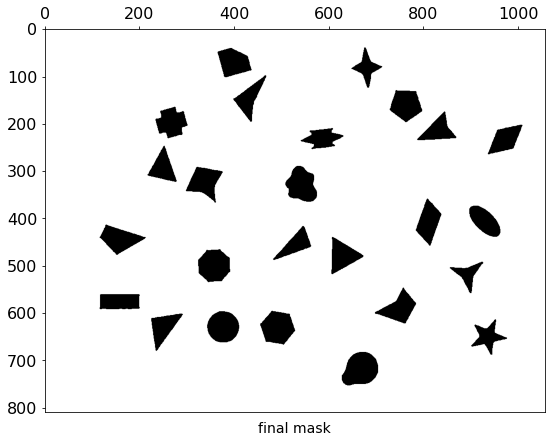

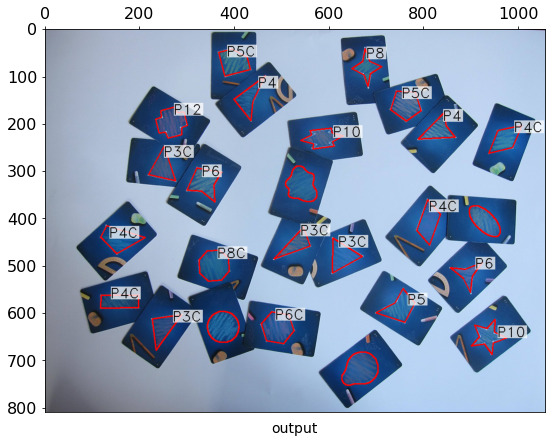

Figures quantity: 25
1. P3C; center coords: (249, 631)
2. P6C; center coords: (490, 630)
3. P4C; center coords: (157, 575)
4. P5; center coords: (746, 584)
5. P6; center coords: (890, 518)
6. P3C; center coords: (627, 478)
7. P3C; center coords: (529, 453)
8. P4C; center coords: (152, 442)
9. P4C; center coords: (809, 408)
10. P6; center coords: (339, 328)
11. P3C; center coords: (248, 291)
12. P4C; center coords: (970, 232)
13. P4; center coords: (835, 210)
14. P5C; center coords: (761, 160)
15. P4; center coords: (433, 148)
16. P5C; center coords: (399, 66)
17. P8C; center coords: (356, 499)
18. P8; center coords: (678, 81)
19. P10; center coords: (933, 649)
20. P10; center coords: (584, 230)
21. P12; center coords: (266, 197)
22. smooth; center coords: (661, 717)
23. smooth; center coords: (374, 626)
24. smooth; center coords: (928, 405)
25. smooth; center coords: (539, 328)



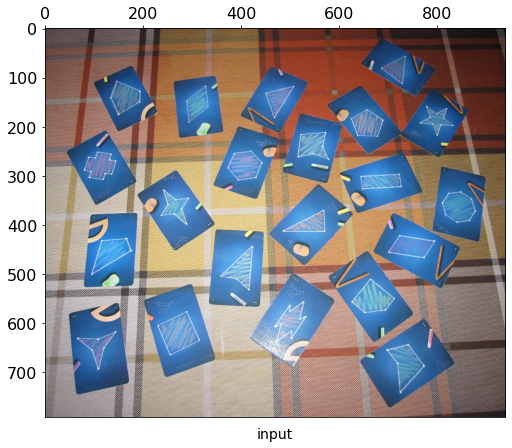

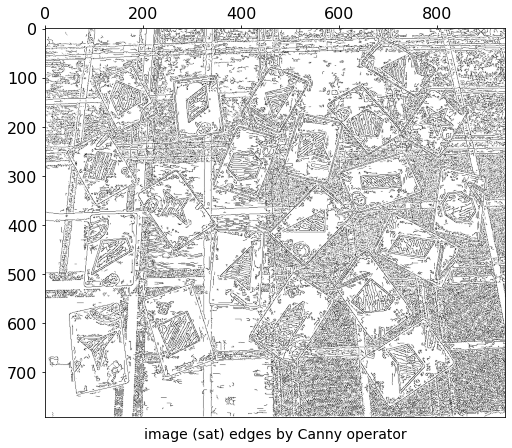

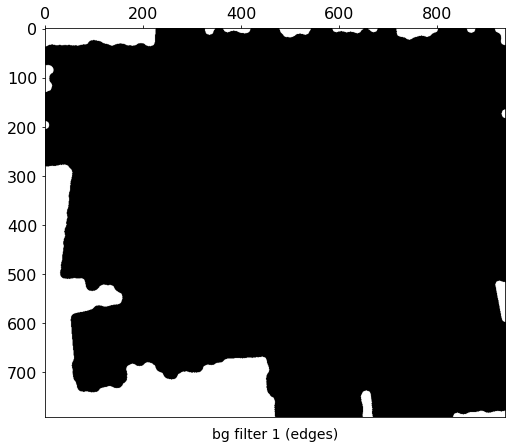

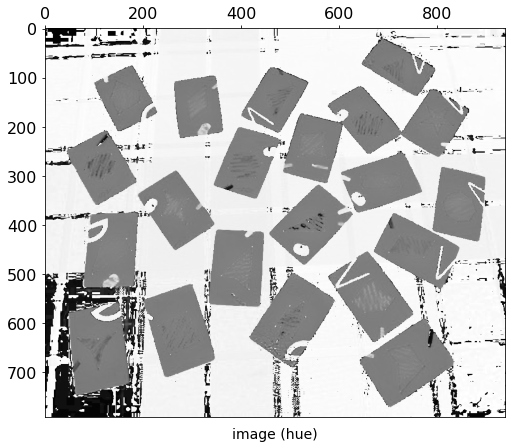

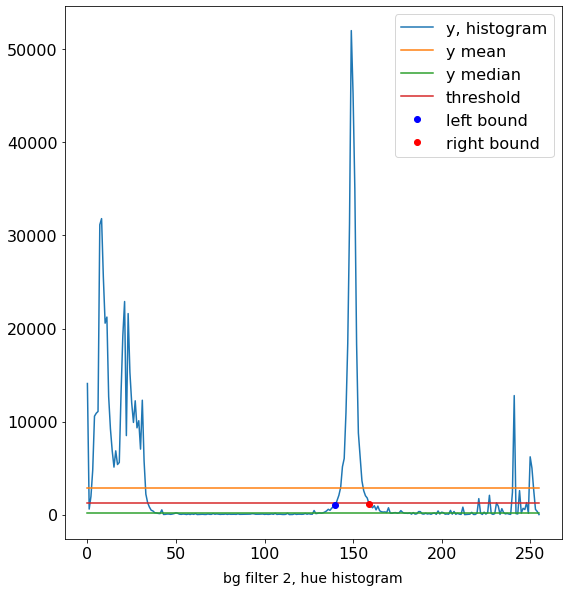

...

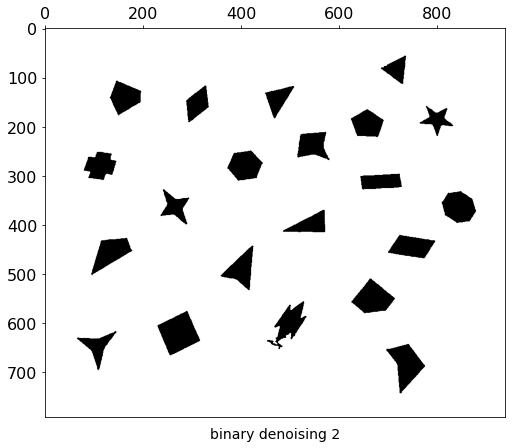

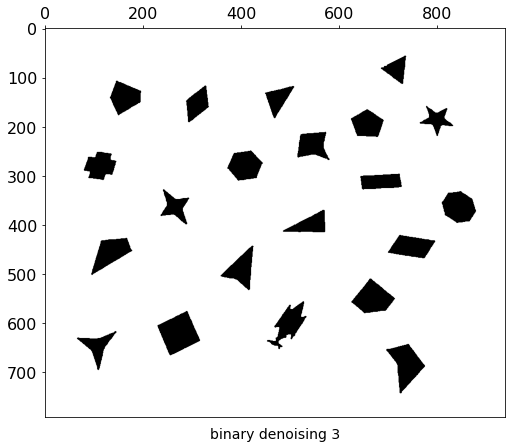

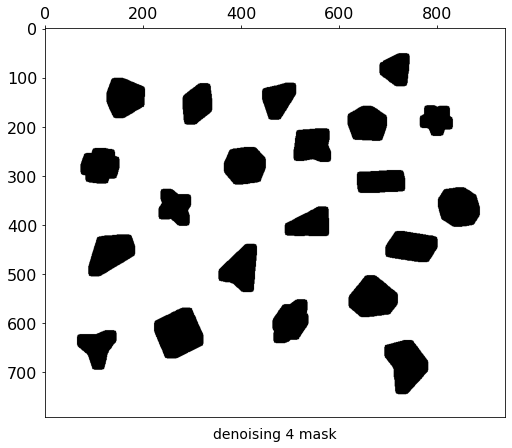

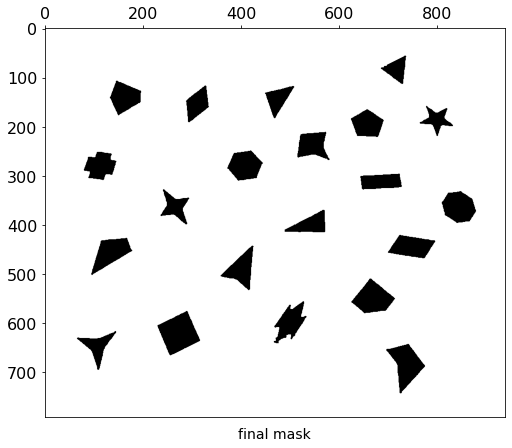

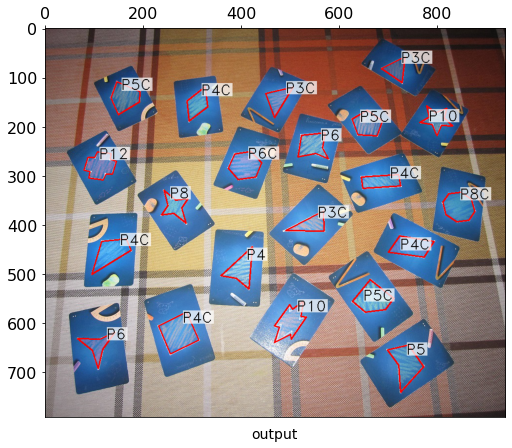

Figures quantity: 21
1. P5; center coords: (730, 683)
2. P6; center coords: (106, 647)
3. P4C; center coords: (271, 620)
4. P5C; center coords: (668, 553)
5. P4; center coords: (396, 497)
6. P4C; center coords: (137, 454)
7. P4C; center coords: (746, 444)
8. P3C; center coords: (541, 399)
9. P4C; center coords: (683, 312)
10. P6C; center coords: (406, 279)
11. P6; center coords: (550, 243)
12. P5C; center coords: (656, 195)
13. P3C; center coords: (473, 145)
14. P4C; center coords: (309, 154)
15. P5C; center coords: (162, 141)
16. P3C; center coords: (715, 83)
17. P8C; center coords: (842, 363)
18. P8; center coords: (264, 363)
19. P10; center coords: (499, 597)
20. P12; center coords: (112, 280)
21. P10; center coords: (797, 186)

Wall time: 41.6 s


In [15]:
%%time
for i in [2, 5]:
    img = src_images[i]
    name = src_names[i]
    vis_folder = f'{vis_folder_}/{name}'
    os.makedirs(vis_folder, exist_ok=True)
    
    save_path= f'{vis_folder}/input' if chk_dump_vis else None
    show_images([img], ['input'], save_path=save_path)
    
    mask = mask_cards(img, chk_dump_vis=chk_dump_vis)
    mask = mask_figures(img, mask, chk_dump_vis=chk_dump_vis)
    res, figures = find_figures(img, mask, name, chk_fill=chk_fill,
                                chk_border=chk_border, chk_label=chk_label)
    
    save_path= f'{vis_folder}/output' if chk_dump_vis else None
    show_images([res], ['output'], save_path=save_path)
    
    out_info = print_fig_info(figures)
    if chk_save_res:
        Image.fromarray(res).save(f'res_{name}')
        with open(f'res_{name}_info.txt', 'w') as fout:
            fout.writelines(out_info)

### Experiments

Протестируем алгоритм распознавания фигур на всех входных данных:

In [16]:
input_folder = 'input'
vis_folder_ = 'vis'

chk_dump_vis = False

chk_fill = False
chk_border = True
chk_label = True

chk_save_res = True

In [17]:
src_images = []
src_names = []
for i in [1, 2, 4, 6, 7, 9, 10]:
    name = f'IMG_{i}.jpg'
    src_images.append(np.array(Image.open(f'{input_folder}/{name}')))
    src_names.append(name)

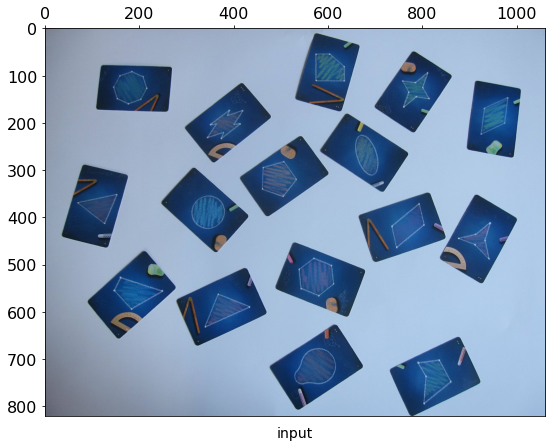

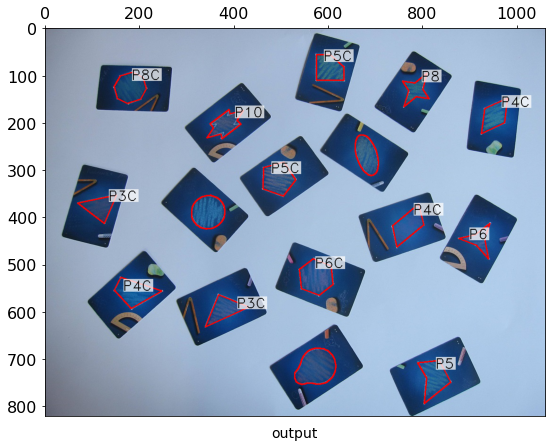

Figures quantity: 16
1. P5; center coords: (817, 738)
2. P3C; center coords: (379, 595)
3. P4C; center coords: (183, 557)
4. P6C; center coords: (573, 526)
5. P6; center coords: (917, 448)
6. P4C; center coords: (767, 417)
7. P3C; center coords: (115, 378)
8. P5C; center coords: (492, 318)
9. P4C; center coords: (950, 185)
10. P5C; center coords: (603, 82)
11. P8; center coords: (783, 130)
12. P8C; center coords: (180, 125)
13. P10; center coords: (381, 202)
14. smooth; center coords: (568, 718)
15. smooth; center coords: (345, 388)
16. smooth; center coords: (680, 269)



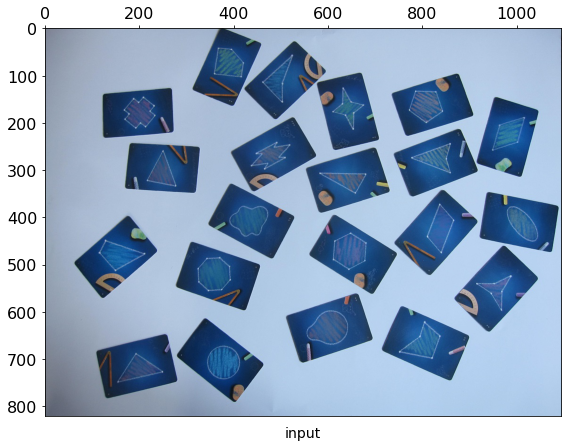

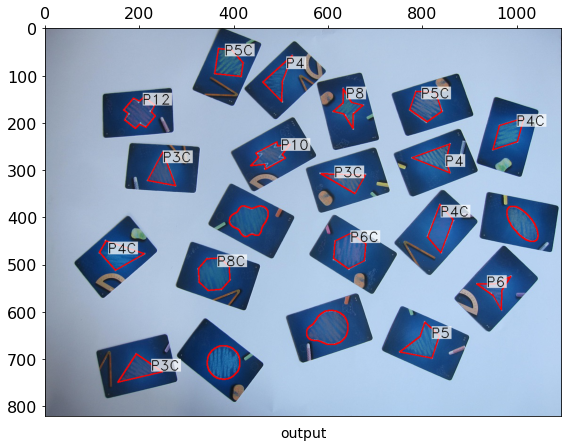

Figures quantity: 21
1. P3C; center coords: (198, 721)
2. P5; center coords: (800, 661)
3. P6; center coords: (955, 554)
4. P4C; center coords: (150, 478)
5. P6C; center coords: (644, 471)
6. P4C; center coords: (837, 423)
7. P3C; center coords: (639, 323)
8. P3C; center coords: (247, 305)
9. P4; center coords: (835, 276)
10. P4C; center coords: (981, 223)
11. P5C; center coords: (806, 163)
12. P4; center coords: (496, 110)
13. P5C; center coords: (391, 72)
14. P8C; center coords: (357, 520)
15. P8; center coords: (641, 169)
16. P10; center coords: (477, 269)
17. P12; center coords: (200, 178)
18. smooth; center coords: (376, 706)
19. smooth; center coords: (599, 634)
20. smooth; center coords: (1012, 415)
21. smooth; center coords: (433, 406)



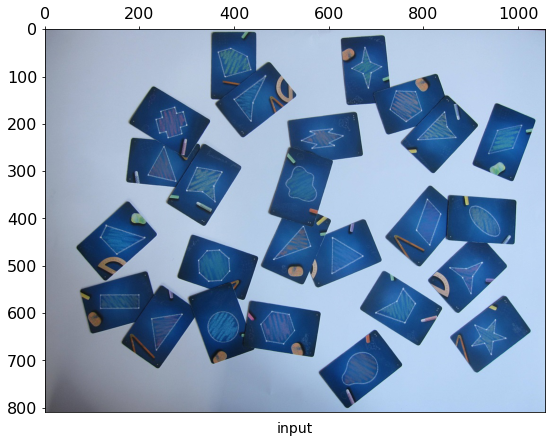

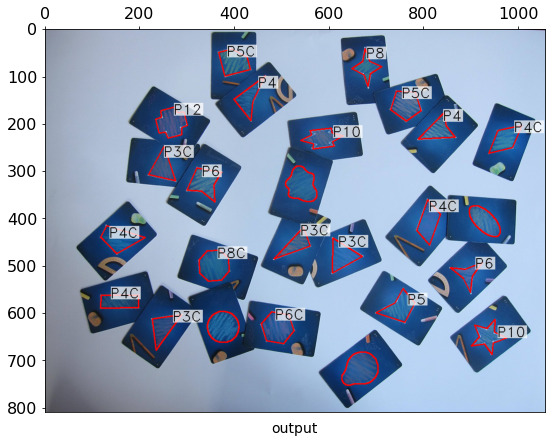

Figures quantity: 25
1. P3C; center coords: (249, 631)
2. P6C; center coords: (490, 630)
3. P4C; center coords: (157, 575)
4. P5; center coords: (746, 584)
5. P6; center coords: (890, 518)
6. P3C; center coords: (627, 478)
7. P3C; center coords: (529, 453)
8. P4C; center coords: (152, 442)
9. P4C; center coords: (809, 408)
10. P6; center coords: (339, 328)
11. P3C; center coords: (248, 291)
12. P4C; center coords: (970, 232)
13. P4; center coords: (835, 210)
14. P5C; center coords: (761, 160)
15. P4; center coords: (433, 148)
16. P5C; center coords: (399, 66)
17. P8C; center coords: (356, 499)
18. P8; center coords: (678, 81)
19. P10; center coords: (933, 649)
20. P10; center coords: (584, 230)
21. P12; center coords: (266, 197)
22. smooth; center coords: (661, 717)
23. smooth; center coords: (374, 626)
24. smooth; center coords: (928, 405)
25. smooth; center coords: (539, 328)



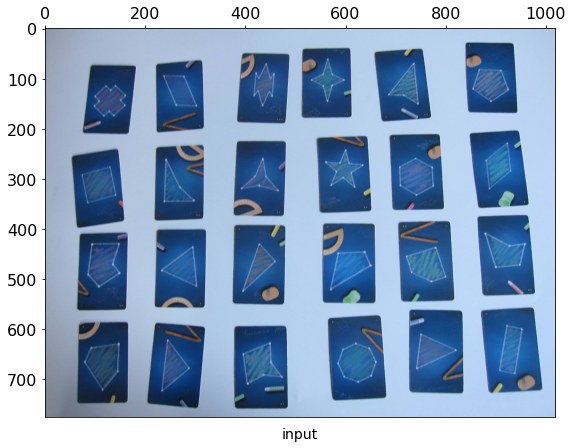

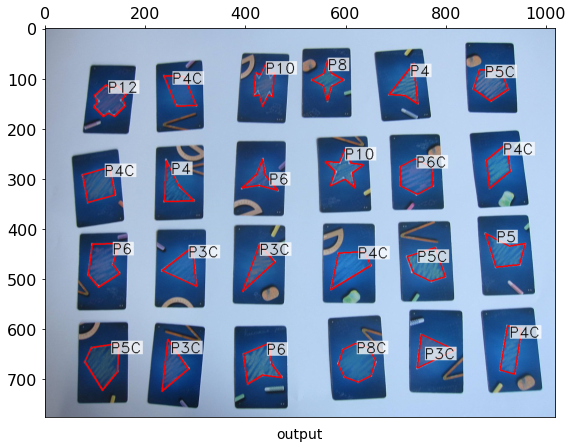

Figures quantity: 24
1. P5C; center coords: (115, 666)
2. P6; center coords: (433, 673)
3. P3C; center coords: (254, 674)
4. P3C; center coords: (769, 642)
5. P4C; center coords: (927, 640)
6. P4C; center coords: (609, 471)
7. P5C; center coords: (759, 475)
8. P3C; center coords: (275, 477)
9. P3C; center coords: (425, 473)
10. P6; center coords: (119, 471)
11. P5; center coords: (920, 443)
12. P4C; center coords: (106, 312)
13. P4; center coords: (260, 316)
14. P6; center coords: (428, 299)
15. P6C; center coords: (739, 295)
16. P4C; center coords: (902, 274)
17. P4C; center coords: (268, 125)
18. P5C; center coords: (886, 111)
19. P4; center coords: (719, 121)
20. P8C; center coords: (620, 666)
21. P8; center coords: (562, 103)
22. P10; center coords: (595, 282)
23. P12; center coords: (128, 144)
24. P10; center coords: (436, 112)



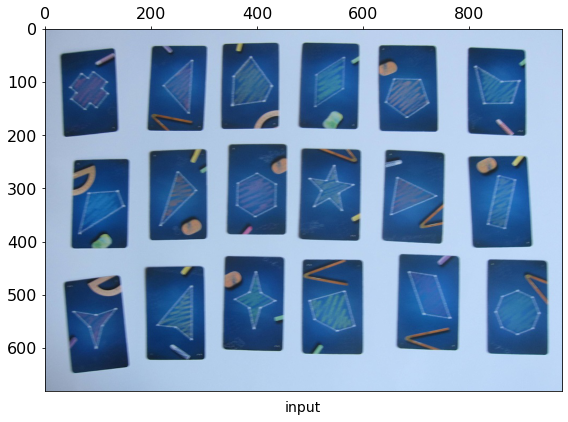

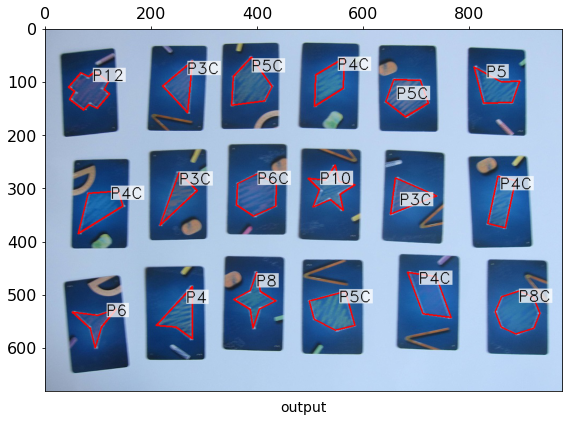

Figures quantity: 18
1. P6; center coords: (94, 554)
2. P5C; center coords: (539, 535)
3. P4; center coords: (252, 546)
4. P4C; center coords: (723, 500)
5. P4C; center coords: (106, 333)
6. P3C; center coords: (682, 314)
7. P4C; center coords: (859, 325)
8. P6C; center coords: (397, 311)
9. P3C; center coords: (251, 314)
10. P5C; center coords: (680, 126)
11. P5; center coords: (852, 109)
12. P3C; center coords: (255, 108)
13. P4C; center coords: (535, 99)
14. P5C; center coords: (386, 105)
15. P8C; center coords: (889, 533)
16. P8; center coords: (394, 510)
17. P10; center coords: (537, 301)
18. P12; center coords: (82, 115)



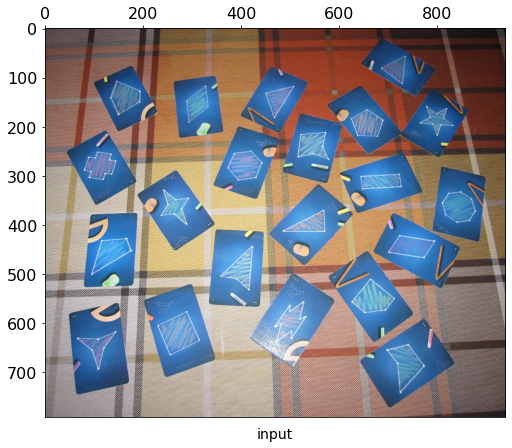

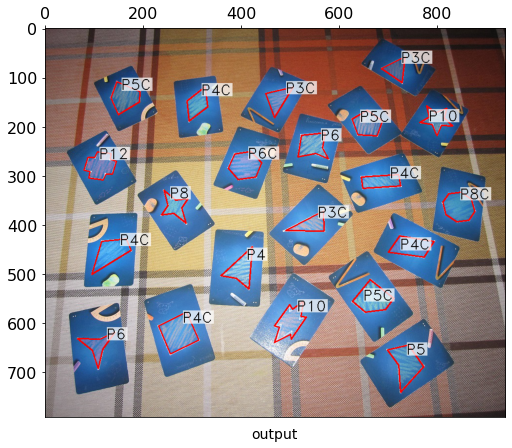

Figures quantity: 21
1. P5; center coords: (730, 683)
2. P6; center coords: (106, 647)
3. P4C; center coords: (271, 620)
4. P5C; center coords: (668, 553)
5. P4; center coords: (396, 497)
6. P4C; center coords: (137, 454)
7. P4C; center coords: (746, 444)
8. P3C; center coords: (541, 399)
9. P4C; center coords: (683, 312)
10. P6C; center coords: (406, 279)
11. P6; center coords: (550, 243)
12. P5C; center coords: (656, 195)
13. P3C; center coords: (473, 145)
14. P4C; center coords: (309, 154)
15. P5C; center coords: (162, 141)
16. P3C; center coords: (715, 83)
17. P8C; center coords: (842, 363)
18. P8; center coords: (264, 363)
19. P10; center coords: (499, 597)
20. P12; center coords: (112, 280)
21. P10; center coords: (797, 186)



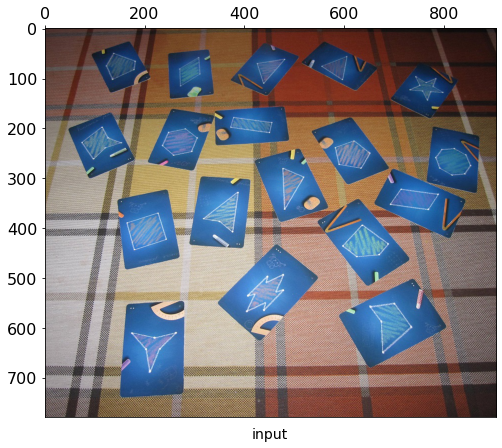

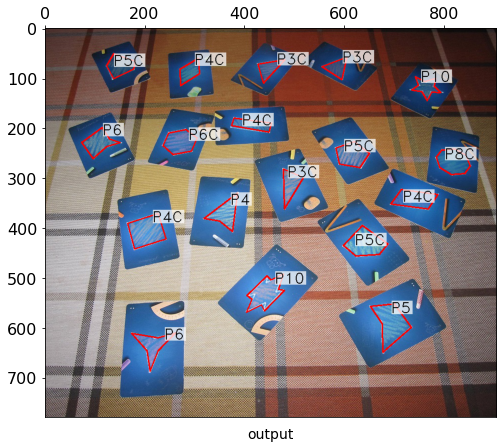

Figures quantity: 18
1. P6; center coords: (216, 636)
2. P5; center coords: (686, 589)
3. P5C; center coords: (641, 434)
4. P4C; center coords: (203, 406)
5. P4; center coords: (356, 376)
6. P4C; center coords: (739, 342)
7. P3C; center coords: (491, 314)
8. P5C; center coords: (613, 253)
9. P6C; center coords: (269, 227)
10. P6; center coords: (114, 229)
11. P4C; center coords: (413, 193)
12. P3C; center coords: (447, 81)
13. P4C; center coords: (289, 87)
14. P3C; center coords: (584, 79)
15. P5C; center coords: (150, 75)
16. P8C; center coords: (816, 267)
17. P10; center coords: (441, 530)
18. P10; center coords: (762, 118)

Wall time: 37.7 s


In [18]:
%%time
for i in range(7):
    img = src_images[i]
    name = src_names[i]
    vis_folder = f'{vis_folder_}/{name}'
    os.makedirs(vis_folder, exist_ok=True)
    
    save_path= f'{vis_folder}/input' if chk_dump_vis else None
    show_images([img], ['input'], save_path=save_path)
    
    mask = mask_cards(img, chk_dump_vis=chk_dump_vis)
    mask = mask_figures(img, mask, chk_dump_vis=chk_dump_vis)
    res, figures = find_figures(img, mask, name, chk_fill=chk_fill,
                                chk_border=chk_border, chk_label=chk_label)
    
    save_path= f'{vis_folder}/output' if chk_dump_vis else None
    show_images([res], ['output'], save_path=save_path)
    
    out_info = print_fig_info(figures)
    if chk_save_res:
        Image.fromarray(res).save(f'res_{name}')
        with open(f'res_{name}_info.txt', 'w') as fout:
            fout.writelines(out_info)

### Program

In [19]:
def process(name, chk_dump_vis=False, chk_save_res=False,
            chk_fill=False, chk_border=True, chk_label=True):
    try:
        img = np.array(Image.open(f'{input_folder}/{name}'))
    except:
        print('Can not load image!')
        return

    if chk_dump_vis:
        vis_folder = f'{vis_folder_}/{name}'
        try:
            os.makedirs(vis_folder, exist_ok=True)
        except:
            print('Can not create folder for visualization!')
            return

    show_image_cv(img, f'Input {name}')

    mask = mask_cards(img, chk_dump_vis=chk_dump_vis)
    mask = mask_figures(img, mask, chk_dump_vis=chk_dump_vis)
    res, figures = find_figures(img, mask, name, chk_fill=chk_fill,
                                chk_border=chk_border, chk_label=chk_label)
    
    out_info = print_fig_info(figures)
    show_image_cv(res, f'Result {name}')
    if chk_save_res:
        try:
            Image.fromarray(res).save(f'{output_folder}/res_{name}')
            with open(f'{output_folder}/res_{name}_info.txt', 'w') as fout:
                fout.writelines(out_info)
        except:
            print('Can not save result!')
            return

In [21]:
# you can set parameters and flags
input_folder = 'input'
vis_folder_ = 'vis'
output_folder = input_folder

chk_dump_vis = False
chk_save_res = True
chk_fill = False
chk_border = True
chk_label = True

# program
name = input()

try:
    process(name, chk_dump_vis=chk_dump_vis, chk_save_res=chk_save_res,
            chk_fill=chk_fill, chk_border=chk_border, chk_label=chk_label)
except:
    print('Error! Something gone bad!')

IMG_4.jpg
Figures quantity: 25
1. P3C; center coords: (249, 631)
2. P6C; center coords: (490, 630)
3. P4C; center coords: (157, 575)
4. P5; center coords: (746, 584)
5. P6; center coords: (890, 518)
6. P3C; center coords: (627, 478)
7. P3C; center coords: (529, 453)
8. P4C; center coords: (152, 442)
9. P4C; center coords: (809, 408)
10. P6; center coords: (339, 328)
11. P3C; center coords: (248, 291)
12. P4C; center coords: (970, 232)
13. P4; center coords: (835, 210)
14. P5C; center coords: (761, 160)
15. P4; center coords: (433, 148)
16. P5C; center coords: (399, 66)
17. P8C; center coords: (356, 499)
18. P8; center coords: (678, 81)
19. P10; center coords: (933, 649)
20. P10; center coords: (584, 230)
21. P12; center coords: (266, 197)
22. smooth; center coords: (661, 717)
23. smooth; center coords: (374, 626)
24. smooth; center coords: (928, 405)
25. smooth; center coords: (539, 328)

